In [51]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/TinyMLDrive/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/.shortcut-targets-by-id/1CTqSzBrCYC0m9cNgwEZtlymQ-3SMJG99/TinyMLDrive


In [52]:
%pip -q install rasterio
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

import glob
import os
import rasterio
from matplotlib import colors
from tqdm import tqdm

#This stops the excessive warnings
from rasterio import logging
log = logging.getLogger()
log.setLevel(logging.ERROR)

#Importing the tinyML toolkit

We use here the NN trained and the scaler constructed in https://github.com/lonanni/RemoteSensing_Environment_Projects/blob/main/NN_BCLWMasks.ipynb. You can also download them from here:

In [53]:
NN_files_dir = "/content/drive/MyDrive/TinyML/" # change with the location where you have these files

In [54]:
BCLWMasks = tf.keras.models.load_model(NN_files_dir+"BCLWMasks.h5")


In [55]:
import joblib
scaler_filename = "scaler_BCLW.gz"
scaler_BCLW = joblib.load(scaler_filename)


In [56]:
#This scales the image colours so that it looks nice
def scale_im(reader):

    red = reader.read(3)
    green = reader.read(2)
    blue = reader.read(1)
    scale = lambda x : (x*0.0000275) - 0.2
    return np.dstack([scale(red), scale(green), scale(blue)]) * 5

In [57]:
from matplotlib import colors


In [58]:
cmap_masks = colors.ListedColormap([ 'lightblue', 'blue', 'white', 'black',])


LandSat8

In [59]:
def plot_prediction(path_main_directory):
    if not os.path.isdir(path_main_directory):
        return "Main directory does not exist."

    contents = os.listdir(path_main_directory)

    subdirectory_SR = path_main_directory + "/SR"
    list_date = os.listdir(subdirectory_SR)

    prediction_count = 0  # To count number of predictions plotted

    for dirpath, dirnames, filenames in os.walk(subdirectory_SR):
        if filenames:
            for filename in filenames:
                # Limit to 3 predictions per location
                if prediction_count >= 6:
                    break  # Stop plotting more predictions for this location

                file_path = os.path.join(dirpath, filename)
                file_path_RAW = file_path.replace("SR", "RAW")
                # Plotting and image processing starts here
                if os.path.isfile(file_path_RAW) == True:

                  RAW_reader = rasterio.open(file_path_RAW)
                  image_shape = RAW_reader.read(1).shape
                  raw_image = np.dstack([
                      RAW_reader.read(1),
                      RAW_reader.read(2),
                      RAW_reader.read(3),
                      RAW_reader.read(4),
                      RAW_reader.read(5),
                      RAW_reader.read(6),
                  ])
                  test_image = scale_im(RAW_reader)

                  # Resize the images
                  test_image_water = scaler_BCLW.transform(raw_image.reshape((image_shape[0], image_shape[1], 6)))

                  predictions = BCLWMasks(test_image_water.reshape((np.prod(image_shape), 6)))
                  predicted_classes = np.argmax(predictions, axis=1)

                  # Plotting
                  fig, ax = plt.subplots(1, 2, dpi=150)
                  ax[0].imshow(test_image)
                  ax[0].title.set_text('RGB Raw image')

                  im = ax[1].imshow(predicted_classes.reshape((image_shape[0], image_shape[1])), cmap=cmap_masks, interpolation="none", vmin=0, vmax=3)
                  cbar = fig.colorbar(im, pad=0.05, fraction=0.046)
                  cbar.set_ticks([0, 1, 2, 3])
                  cbar.set_ticklabels(["land", "water", "cloud", "blank"])

                  ax[1].title.set_text('Keras BCWL Model')

                  plt.show()

                  # Close the figure after displaying it
                  plt.close()

                  # Increment the prediction count
                  prediction_count += 1





You can download this dataset from here: https://drive.google.com/drive/folders/1R-LEvnbh3n78v8IpDtFH9aS8M8l2A2g0?usp=sharing

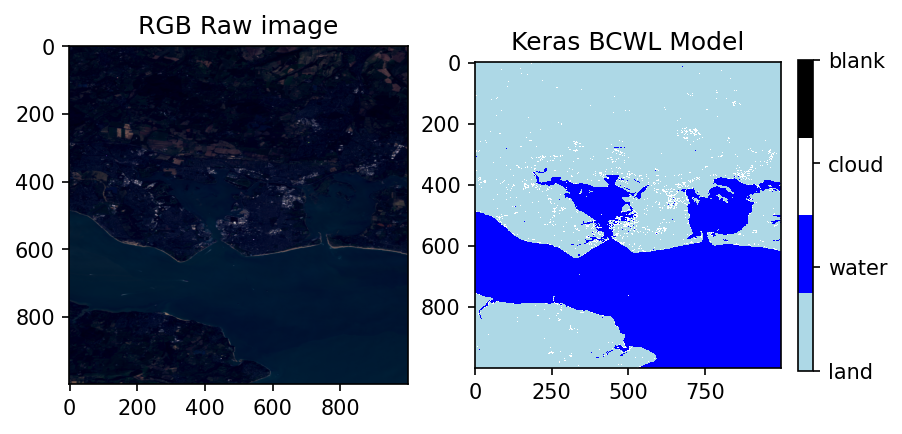

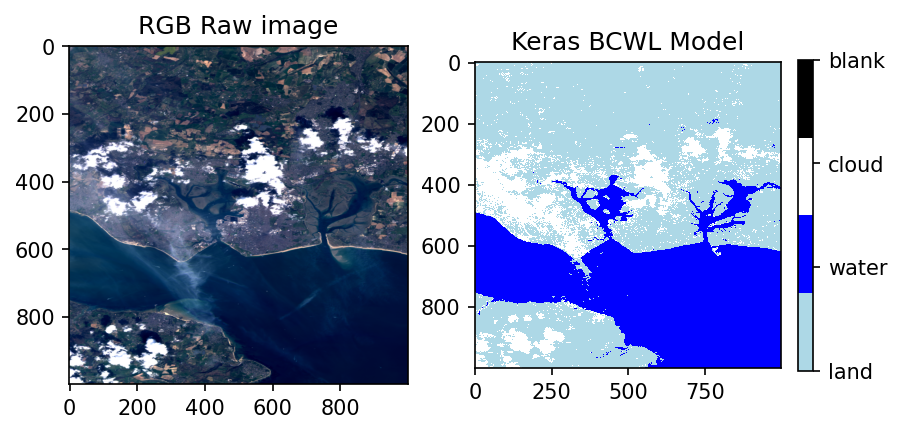

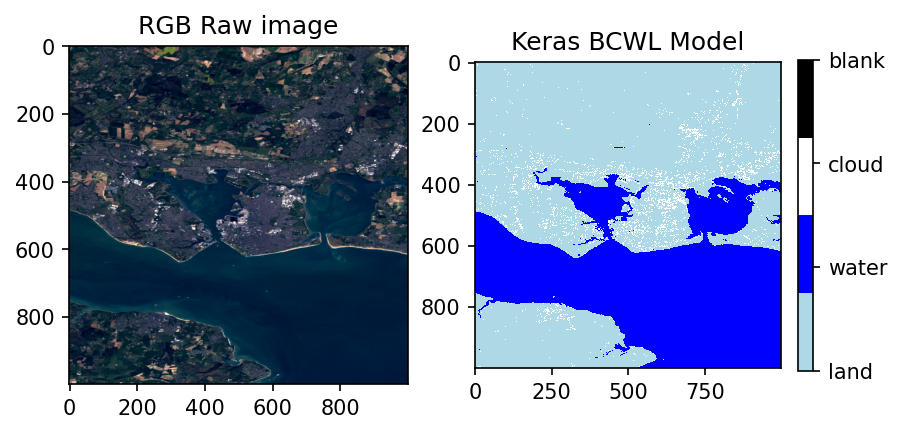

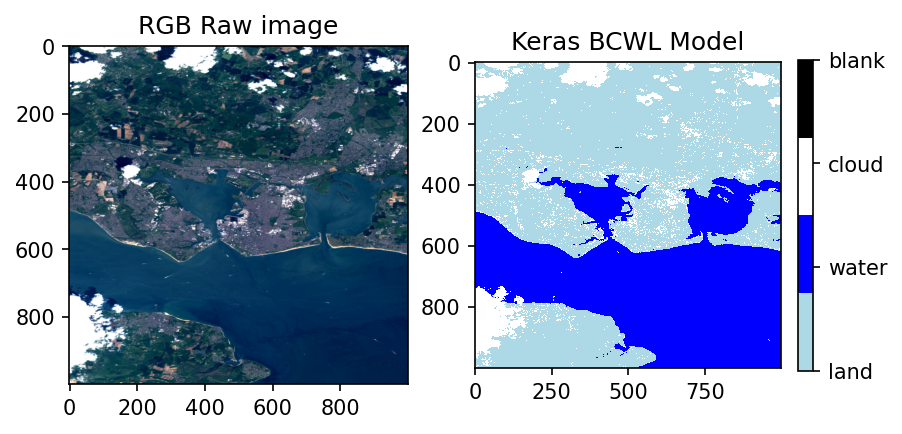

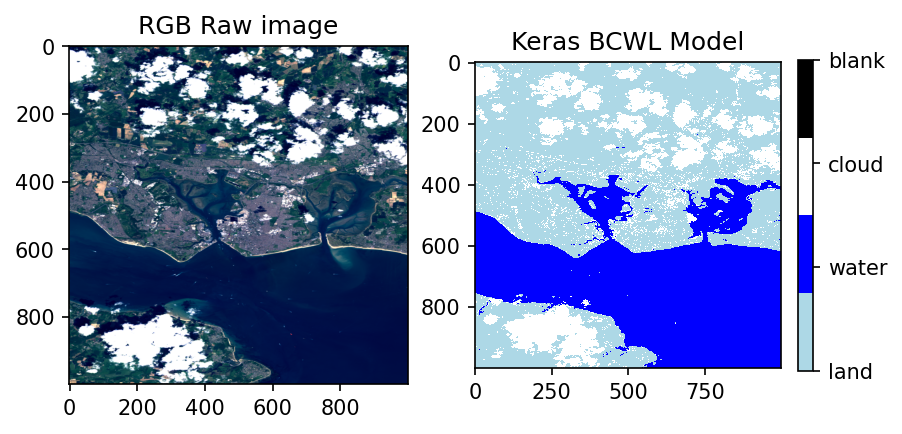

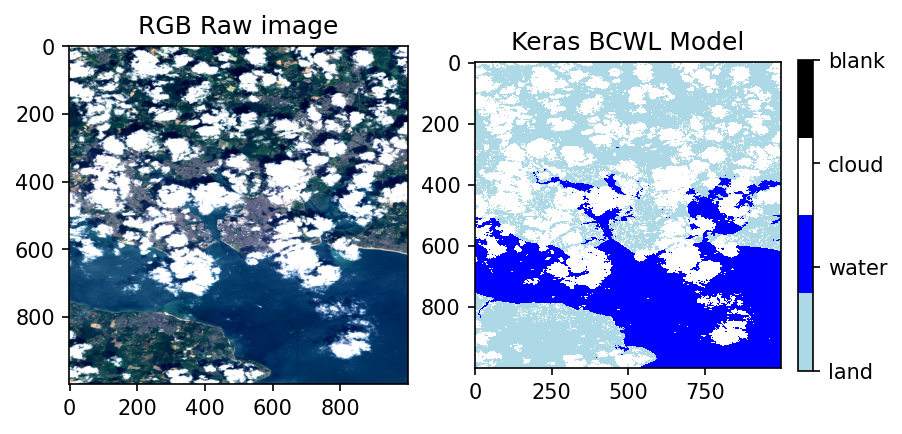

In [60]:
plot_prediction('/content/drive/MyDrive/TinyML/Satellite/Portsmouth')

In [61]:
class Sediment():
    def __init__(self, reader):
      self.reader = reader
      self.swir = reader.read(5)
      self.swir2 = reader.read(6)

      self.nir = reader.read(4)
      self.red = reader.read(3)
      self.green = reader.read(2)
      self.blue = reader.read(1)


    def NDTI(self, prediction):
      """
     - **Normalized Difference Turbidity Index (NDTI)**
     - **Formula**: \((Red - Green) / (Red + Green)\)
     - **Description**: NDTI leverages the fact that sediment-laden water typically has higher reflectance in the red band and lower in the green band compared to clear water.
     - **Application**: Higher NDTI values generally indicate higher turbidity levels, which can be associated with surface sediments.
     - **Paper**: https://www.researchgate.net/figure/Normalized-difference-turbidity-index-NDTI-in-Sentinel-2-images-with-synoptical-clear_fig2_364947274

      """
      NDTI_img = (self.red - self.green) / (self.red + self.green)
      img = np.where(prediction == 1, NDTI_img, np.nan)
      return img

    def turbidity_ratio(self, prediction):

      """
      Turbidity Ratio
      - **Formula**: \(Red / Green\)
      - **Description**: Similar to NDTI, the Red/Green ratio can be used directly to assess the turbidity. Higher ratios suggest more sediment.
      - **Application**: This ratio is simple and effective in identifying sediment concentrations in water.
      https://developers.arcgis.com/python/latest/samples/river-turbidity-estimation-using-sentinel2-data-/#:~:text=Normalized%20difference%20turbidity%20index&text=It%20uses%20the%20phenomenon%20that,of%20red%20spectrum%20also%20increases.
      """
      tr_img = self.red / self.green
      img = np.where(prediction == 1, tr_img, np.nan)
      return img

    def NDSSI_nir(self, prediction):
      """
      ### Normalized Difference Suspended Sediment Index (NDSSI)
        - **Formula**: \((Green - SWIR) / (Green + SWIR)\)
        - **Description**: This index contrasts the reflectance in the green band (where water with sediment has higher reflectance) against the SWIR band (where sediment is more absorbent).
        - **Application**: NDSSI can help differentiate between clear water and water with suspended sediments.
        - **Paper**: https://iopscience.iop.org/article/10.1088/1755-1315/98/1/012058/pdf
      """
      NDSSI_img = (self.green - self.nir) / (self.green + self.nir)
      img = np.where(prediction == 1, NDSSI_img, np.nan)
      return img

    def TSM(self, prediction):
      """
      ### TOTAL SUSPENDED SEDIMENT (tsm)
      - *Description**: Total suspended sediment (TSS) is a water quality parameter that is used to understand sediment transport, aquatic ecosystem health, and engineering problems. The TSS method was designed for the wastewater industry, presumably for samples collected after a settling step at a wastewater treatment facility.
      - **Papers**:https://www.mdpi.com/2076-3417/11/15/7082#:~:text=Total%20suspended%20sediment%20(TSS)%20is,ecosystem%20health%2C%20and%20engineering%20problems. https://caltestlabs.com/analytical-services/priority-pollutants/inorganic-methods/tssandssc/ https://www.sciencedirect.com/topics/agricultural-and-biological-sciences/suspended-sediment
      """
      TSM_img = 3957*(((self.green + self.red)*0.001) / 2)*1.6436
      img = np.where(prediction == 1, TSM_img, np.nan)
      return img

    def SPM(self, prediction):
      """
      ### Suspended Particulate Model
      - **Paper**: https://www.sciencedirect.com/topics/biochemistry-genetics-and-molecular-biology/suspended-particulate-matter#:~:text=SePM%20is%20a%20complex%20mixture,et%20al.%2C%202021a).
      """
      SPM_ind = 2.26*(self.red/self.green)**3 - 5.42 * (self.red/self.green)**2 + 5.58 * (self.red/self.green) - 0.72
      SPM_img = 10**SPM_ind - 1.43
      img = np.where(prediction == 1, SPM_ind, np.nan)
      return img

In [62]:
def plot_sediment(path_main_directory):
    if not os.path.isdir(path_main_directory):
        return "Main directory does not exist."

    contents = os.listdir(path_main_directory)

    subdirectory_SR = path_main_directory + "/SR"
    list_date = os.listdir(subdirectory_SR)

    prediction_count = 0  # To count number of predictions plotted

    for dirpath, dirnames, filenames in os.walk(subdirectory_SR):
        if filenames:
            for filename in filenames:
                # Limit to 3 predictions per location
                if prediction_count >= 6:
                    break  # Stop plotting more predictions for this location


                file_path = os.path.join(dirpath, filename)
                file_path_RAW = file_path.replace("SR", "RAW")
                # Plotting and image processing starts here
                if os.path.isfile(file_path_RAW) == True:

                  RAW_reader = rasterio.open(file_path_RAW)
                  image_shape = RAW_reader.read(1).shape
                  raw_image = np.dstack([
                      RAW_reader.read(1),
                      RAW_reader.read(2),
                      RAW_reader.read(3),
                      RAW_reader.read(4),
                      RAW_reader.read(5),
                      RAW_reader.read(6),
                  ])

                  # Resize the images
                  test_image_water = scaler_BCLW.transform(raw_image.reshape((image_shape[0], image_shape[1], 6)))

                  predictions = BCLWMasks(test_image_water.reshape((np.product(image_shape), 6)))
                  predicted_classes = np.argmax(predictions, axis=1)

                  rgb_image  = scale_im(RAW_reader)
                  # Plotting
                  fig, ax = plt.subplots(2, 3, figsize=(14,6.5))
                  ax[0, 0].imshow(rgb_image)
                  ax[0, 0].title.set_text('RGB image')

                  ####
                  TSM_img = Sediment(RAW_reader).TSM(predicted_classes.reshape((image_shape[0], image_shape[1])))

                  im0 = ax[0, 1].imshow(TSM_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[0, 1].title.set_text('TSM')

                  ####
                  NDSSI_img = Sediment(RAW_reader).NDSSI_nir(predicted_classes.reshape((image_shape[0], image_shape[1])))

                  im0 = ax[0, 2].imshow(NDSSI_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[0, 2].title.set_text('NDSSI nir')

                  ####
                  turbidity_ratio_img = Sediment(RAW_reader).turbidity_ratio(predicted_classes.reshape((image_shape[0], image_shape[1])))

                  im0 = ax[1, 0].imshow(turbidity_ratio_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[1, 0].title.set_text('turbidity ratio')

                  ####


                  NDTI_img = Sediment(RAW_reader).NDTI(predicted_classes.reshape((image_shape[0], image_shape[1])))

                  im0 = ax[1, 1].imshow(NDTI_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[1, 1].title.set_text('NDTI')

                  ####



                  ####


                  SPM_img = Sediment(RAW_reader).SPM(predicted_classes.reshape((image_shape[0], image_shape[1])))

                  im0 = ax[1, 2].imshow(SPM_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[1, 2].title.set_text('SPM')

                  ####

                  plt.show()

                  # Close the figure after displaying it
                  plt.close()

                  # Increment the prediction count
                  prediction_count += 1


<ipython-input-63-464dc93c2564>:1: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  plot_sediment('/content/drive/MyDrive/TinyML/Satellite/Portsmouth')


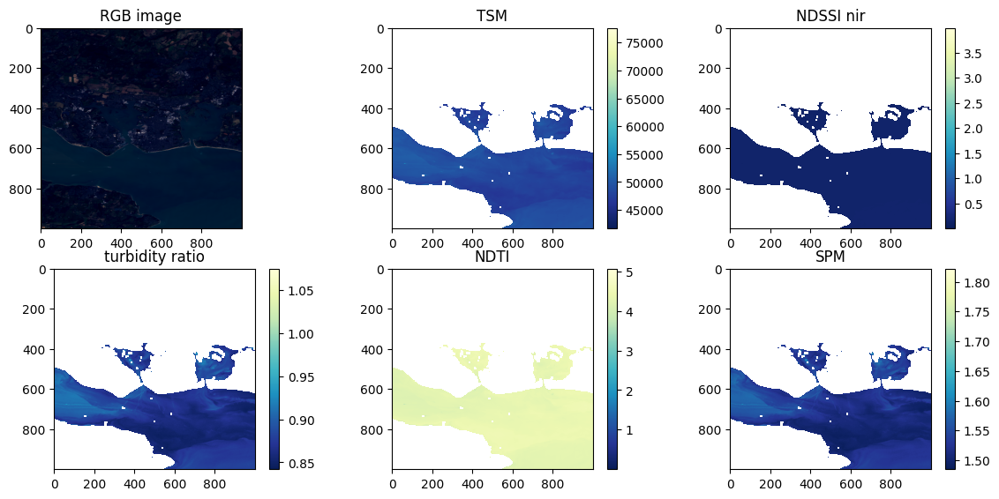

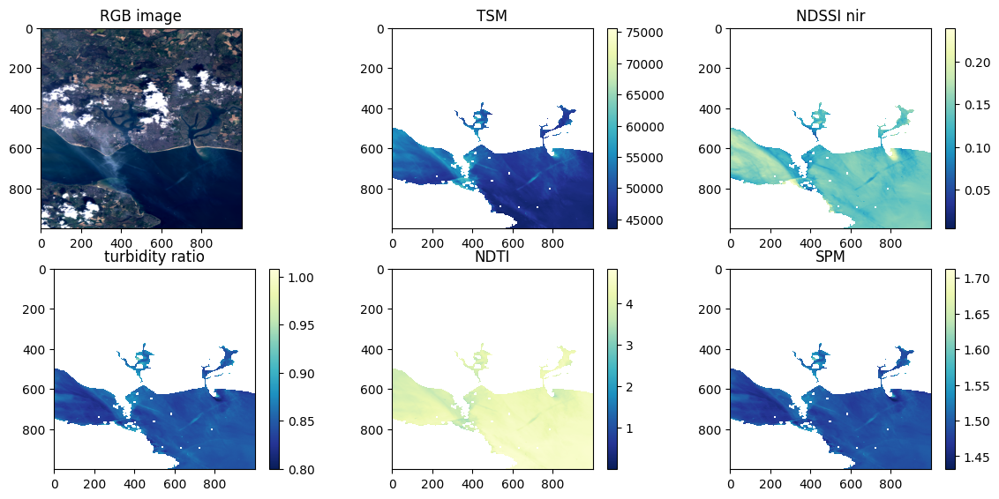

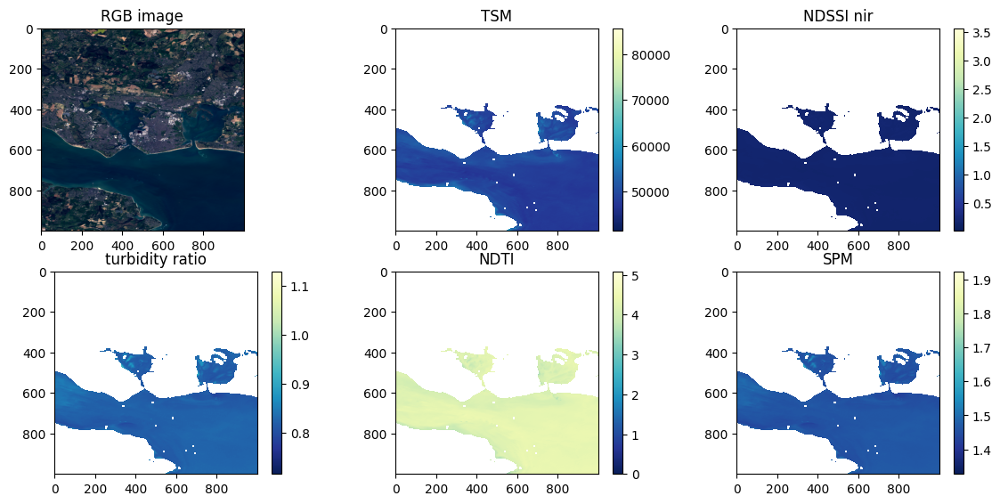

<ipython-input-61-c28d11b72491>:22: RuntimeWarning: divide by zero encountered in divide
  NDTI_img = (self.red - self.green) / (self.red + self.green)


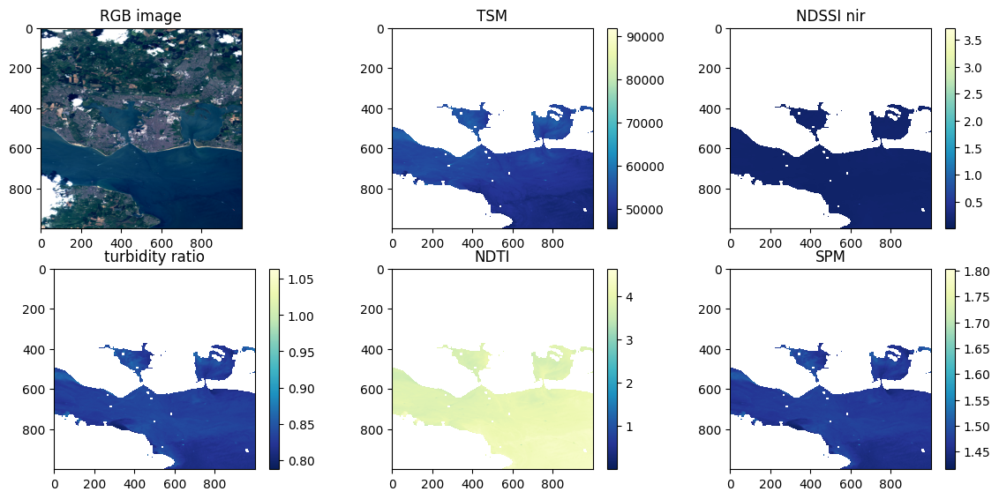

<ipython-input-61-c28d11b72491>:47: RuntimeWarning: divide by zero encountered in divide
  NDSSI_img = (self.green - self.nir) / (self.green + self.nir)


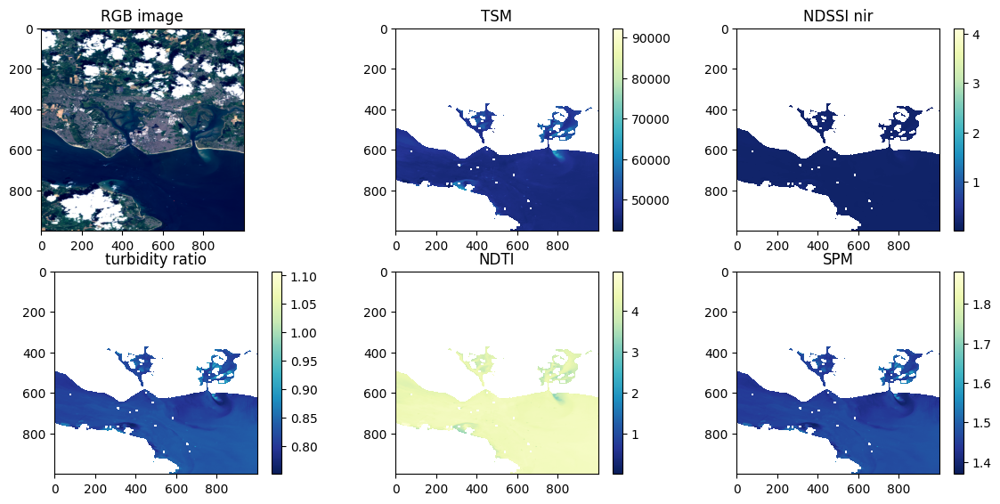

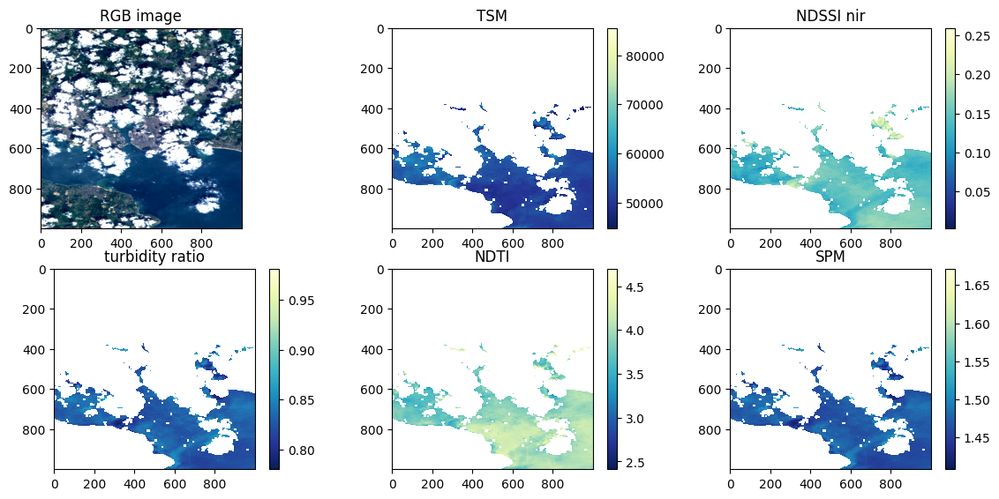

In [63]:
plot_sediment('/content/drive/MyDrive/TinyML/Satellite/Portsmouth')

DEGLINT

Removal of sun glint for mapping shallow waters

In [64]:
from scipy.stats import linregress, binned_statistic

In [65]:
class Sediment_dg():
    """
    As Sediment, this time, we deglint the signal in the different bands
    """
    def __init__(self, reader, water_mask):
      self.reader = reader

      self.nir = reader.read(4)
      self.red = reader.read(3)
      self.green = reader.read(2)
      self.blue = reader.read(1)

      result_B = linregress(self.nir[:,:100].flatten(), self.blue[:,:100].flatten())
      result_G = linregress(self.nir[:,:100].flatten(), self.green[:,:100].flatten())
      result_R = linregress(self.nir[:,:100].flatten(), self.red[:,:100].flatten())

      self.NIR_dg = self.nir - (self.nir  - np.min(self.nir))

      self.R_dg = self.red-result_R.slope* (self.nir  - np.min(self.nir))
      self.G_dg = self.green-result_G.slope* (self.nir  - np.min(self.nir))
      self.B_dg = self.blue-result_B.slope* (self.nir  - np.min(self.nir))

      self.water_mask = water_mask

    def NDTI(self, ):
      """
     **Normalized Difference Turbidity Index (NDTI)**
     **Formula**: \((Red - Green) / (Red + Green)\)
     **Description**: NDTI leverages the fact that sediment-laden water typically has higher reflectance in the red band and lower in the green band compared to clear water.
     **Application**: Higher NDTI values generally indicate higher turbidity levels, which can be associated with surface sediments.


      """
      NDTI_img = (self.R_dg - self.G_dg) / (self.R_dg + self.G_dg)
      img = np.where(self.water_mask == 1, NDTI_img, np.nan)
      return img

    def turbidity_ratio(self, ):

      """
      Turbidity Ratio
      - **Formula**: \(Red / Green\)
      - **Description**: Similar to NDTI, the Red/Green ratio can be used directly to assess the turbidity. Higher ratios suggest more sediment.
      - **Application**: This ratio is simple and effective in identifying sediment concentrations in water.

      """
      tr_img = self.R_dg / self.G_dg
      img = np.where(self.water_mask == 1, tr_img, np.nan)
      return img

    def NDSSI_nir(self, ):
      """
      ### Normalized Difference Suspended Sediment Index (NDSSI)
        - **Formula**: \((Green - SWIR) / (Green + SWIR)\)
        - **Description**: This index contrasts the reflectance in the green band (where water with sediment has higher reflectance) against the SWIR band (where sediment is more absorbent).
        - **Application**: NDSSI can help differentiate between clear water and water with suspended sediments.

      """
      NDSSI_img = (self.G_dg - self.NIR_dg) / (self.G_dg + self.NIR_dg)
      img = np.where(self.water_mask == 1, NDSSI_img, np.nan)
      return img

    def TSM(self, ):
      """
      ### TOTAL SUSPENDED SEDIMENT (tsm)

      """
      TSM_img = 3957*(((self.G_dg + self.R_dg)*0.001) / 2)*1.6436
      img = np.where(self.water_mask == 1, TSM_img, np.nan)
      return img

    def SPM(self, ):
      """
      ### Suspended Particulate Model

      """
      SPM_ind = 2.26*(self.R_dg/self.G_dg)**3 - 5.42 * (self.R_dg/self.G_dg)**2 + 5.58 * (self.R_dg/self.G_dg) - 0.72
      SPM_img = 10**SPM_ind - 1.43
      img = np.where(self.water_mask == 1, SPM_ind, np.nan)
      return img

In [66]:
def plot_sediment(path_main_directory):
    if not os.path.isdir(path_main_directory):
        return "Main directory does not exist."

    contents = os.listdir(path_main_directory)

    subdirectory_SR = path_main_directory + "/SR"
    list_date = os.listdir(subdirectory_SR)

    prediction_count = 0  # To count number of predictions plotted

    for dirpath, dirnames, filenames in os.walk(subdirectory_SR):
        if filenames:
            for filename in filenames:
                # Limit to 16 predictions per location
                if prediction_count >= 16:
                    break  # Stop plotting more predictions for this location


                file_path = os.path.join(dirpath, filename)
                file_path_RAW = file_path.replace("SR", "RAW")
                # Plotting and image processing starts here
                if os.path.isfile(file_path_RAW) == True:

                  RAW_reader = rasterio.open(file_path_RAW)
                  image_shape = RAW_reader.read(1).shape
                  raw_image = np.dstack([
                      RAW_reader.read(1),
                      RAW_reader.read(2),
                      RAW_reader.read(3),
                      RAW_reader.read(4),
                      RAW_reader.read(5),
                      RAW_reader.read(6),
                  ])

                  # Resize the images
                  test_image_water = scaler_BCLW.transform(raw_image.reshape((image_shape[0], image_shape[1], 6)))

                  predictions = BCLWMasks(test_image_water.reshape((np.product(image_shape), 6)))
                  predicted_classes = np.argmax(predictions, axis=1)
                  water_mask = predictions[:,1]
                  water_mask = np.where(water_mask > 0.85, 1, 0)
                  rgb_image  = scale_im(RAW_reader)
                  # Plotting
                  fig, ax = plt.subplots(2, 3, figsize=(12,6.5))
                  ax[0, 0].imshow(rgb_image)
                  ax[0, 0].title.set_text('RGB image')


                  TSM_img = Sediment_dg(RAW_reader, water_mask.reshape((image_shape[0], image_shape[1]))).TSM()

                  im0 = ax[0, 1].imshow(TSM_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[0, 1].title.set_text('TSM')

                  ####
                  NDSSI_img = Sediment_dg(RAW_reader, water_mask.reshape((image_shape[0], image_shape[1]))).NDSSI_nir()

                  im0 = ax[0, 2].imshow(NDSSI_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[0, 2].title.set_text('NDSSI nir')

                  ####
                  turbidity_ratio_img = Sediment_dg(RAW_reader, water_mask.reshape((image_shape[0], image_shape[1]))).turbidity_ratio()

                  im0 = ax[1, 0].imshow(turbidity_ratio_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[1, 0].title.set_text('turbidity ratio')

                  ####


                  NDTI_img = Sediment_dg(RAW_reader, water_mask.reshape((image_shape[0], image_shape[1]))).NDTI()

                  im0 = ax[1, 1].imshow(NDTI_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[1, 1].title.set_text('NDTI')

                  ####



                  ####


                  SPM_img = Sediment_dg(RAW_reader, water_mask.reshape((image_shape[0], image_shape[1]))).SPM()

                  im0 = ax[1, 2].imshow(SPM_img, cmap="YlGnBu_r")
                  cbar = fig.colorbar(im0, pad=0.05, fraction=0.046)
                  ax[1, 2].title.set_text('SPM')

                  ####

                  plt.show()

                  # Close the figure after displaying it
                  plt.close()

                  # Increment the prediction count
                  prediction_count += 1



<ipython-input-67-464dc93c2564>:1: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  plot_sediment('/content/drive/MyDrive/TinyML/Satellite/Portsmouth')


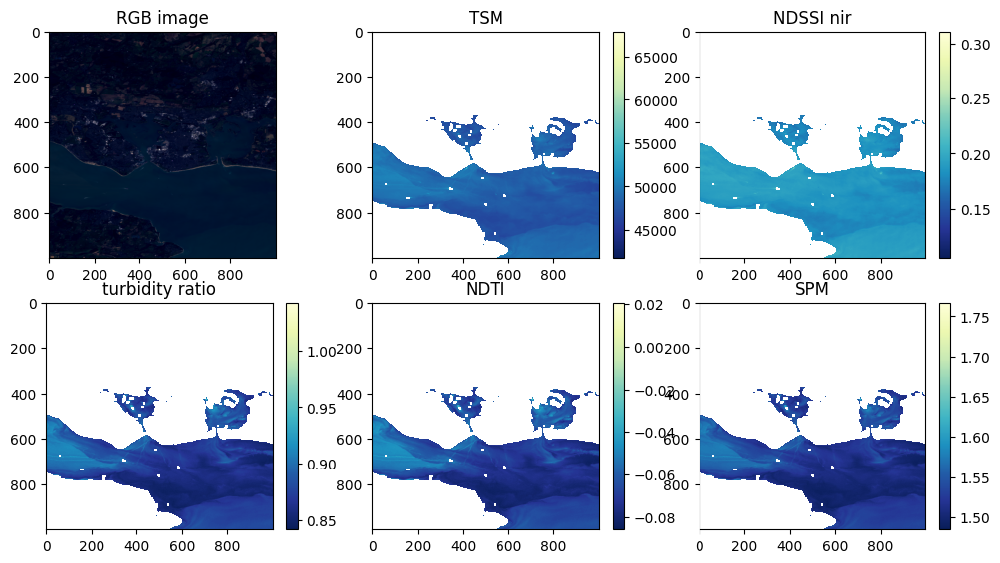

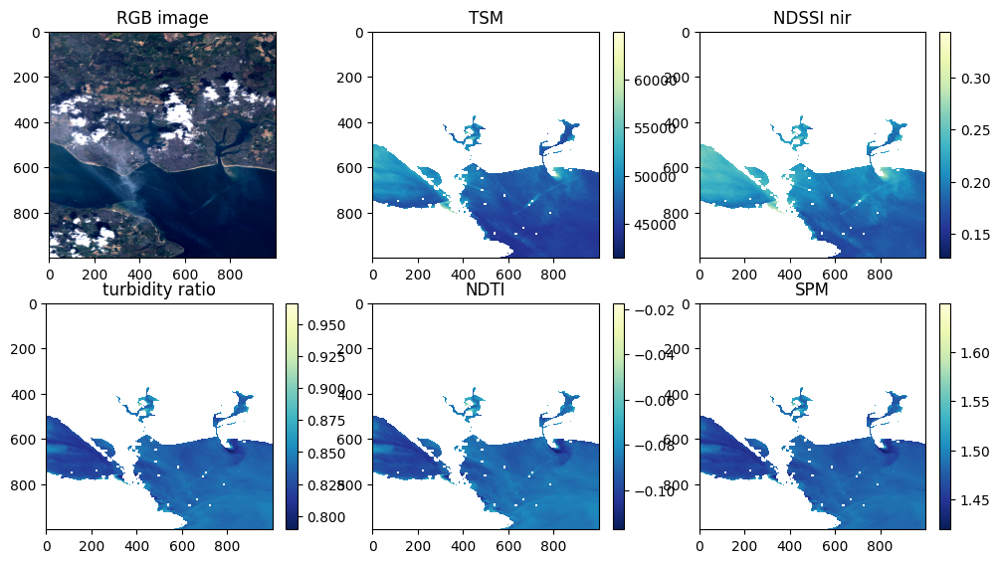

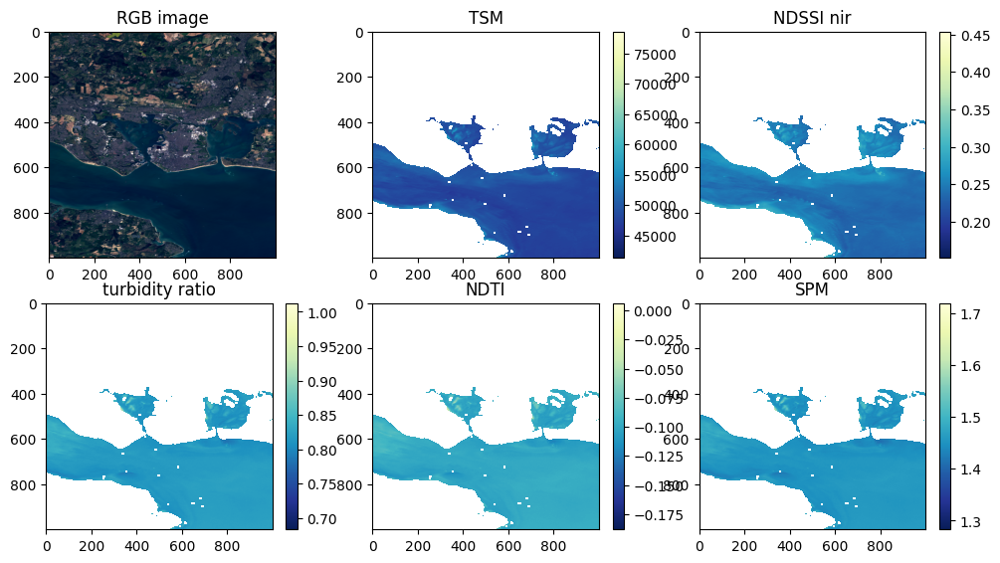

<ipython-input-65-8f74eb6c4395>:78: RuntimeWarning: overflow encountered in power
  SPM_img = 10**SPM_ind - 1.43


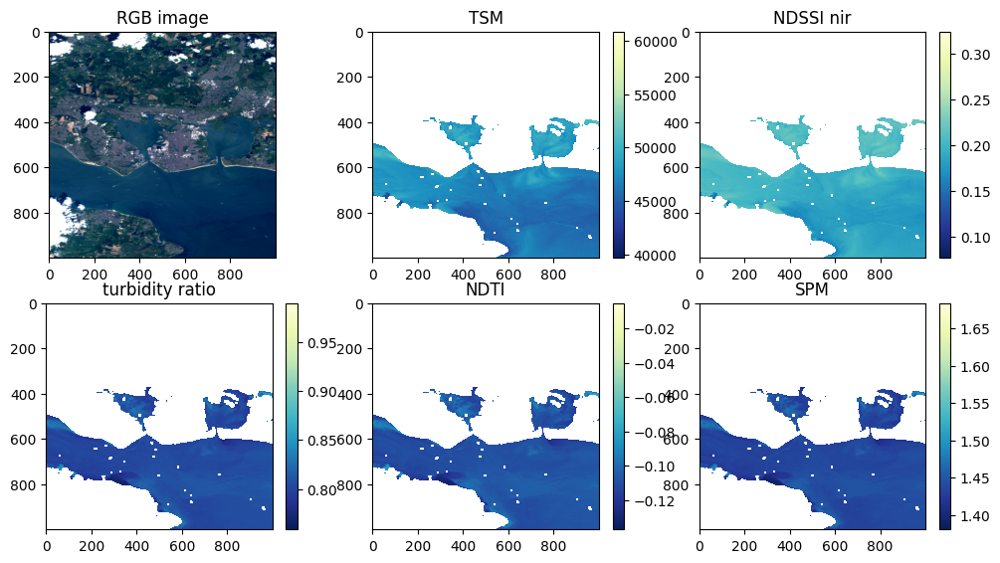

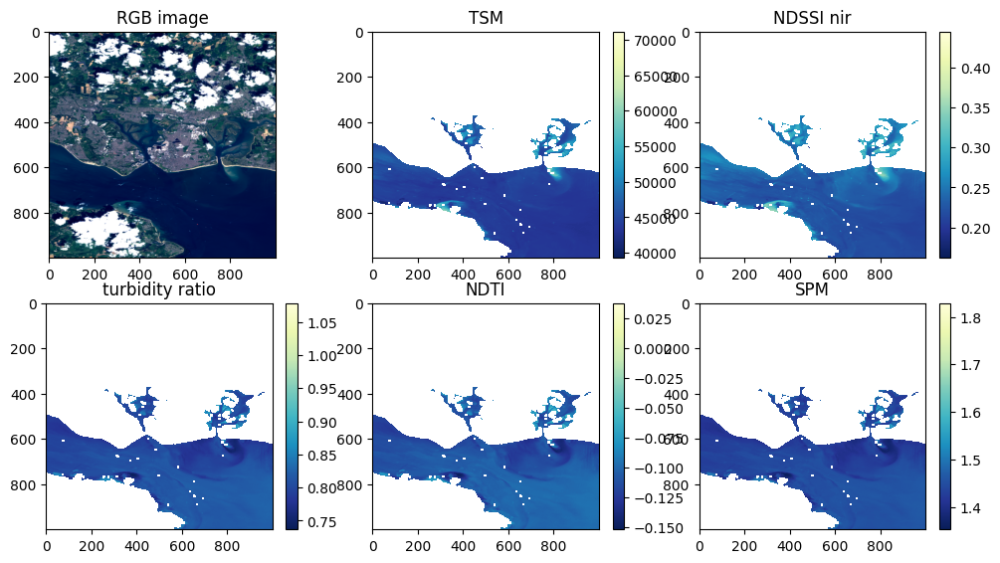

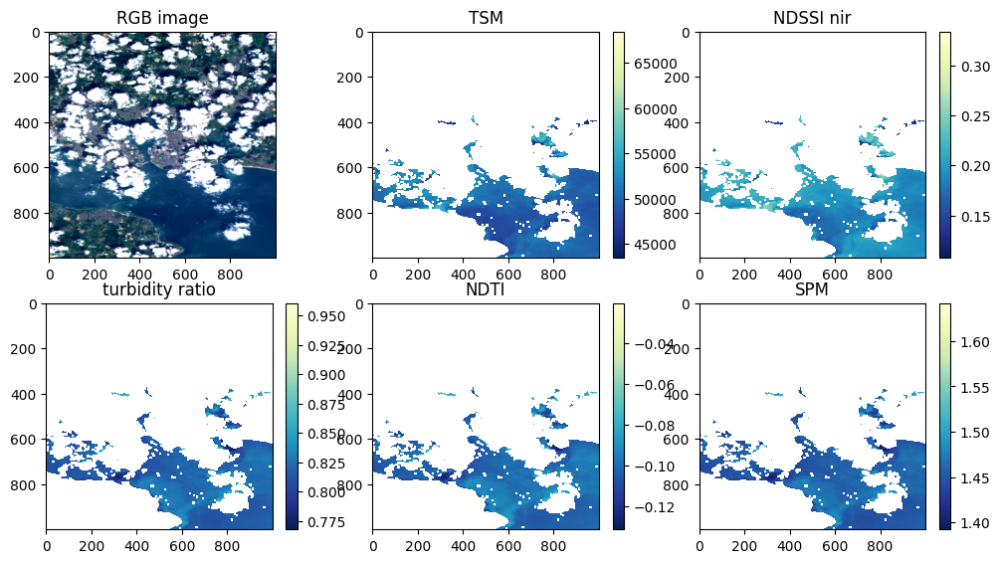

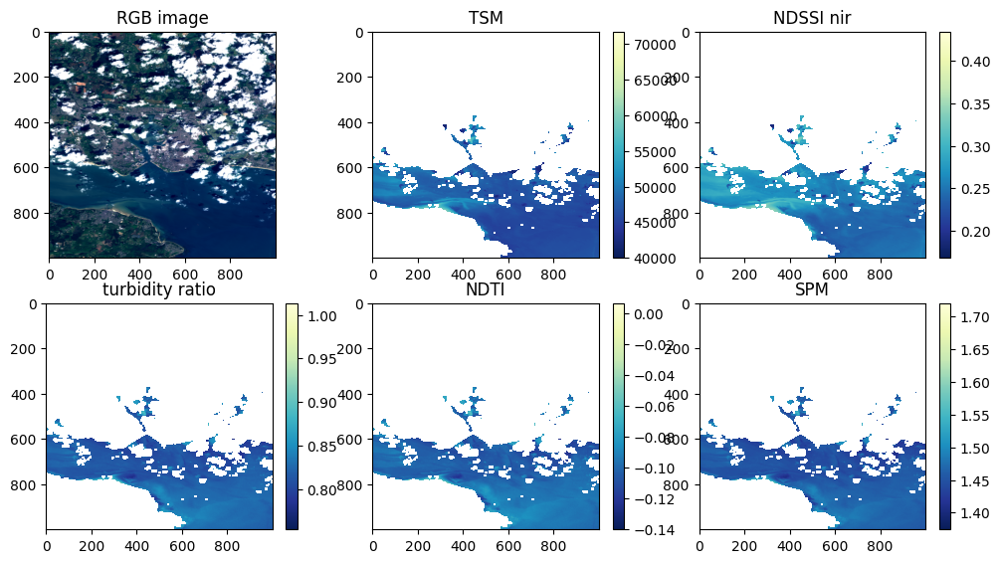

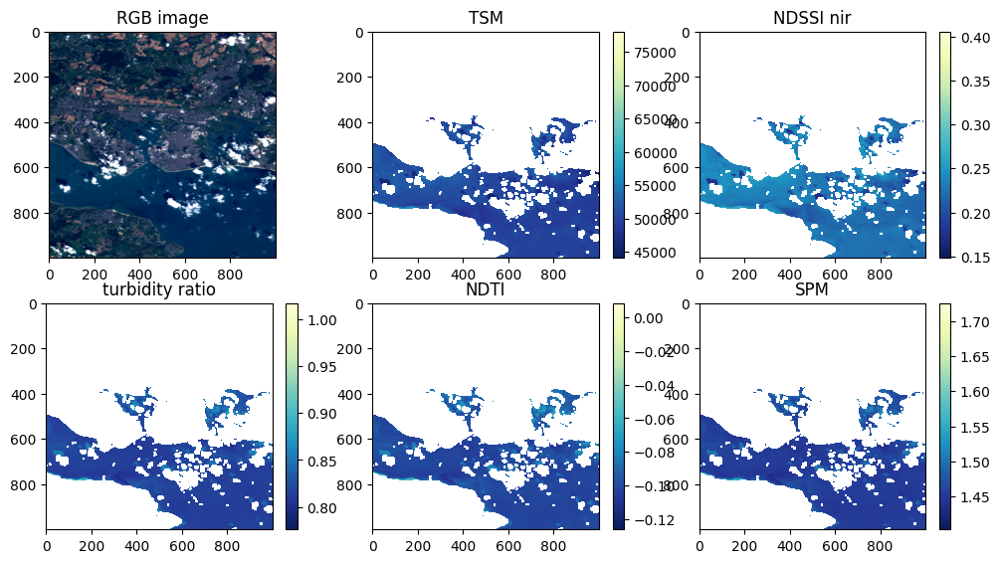

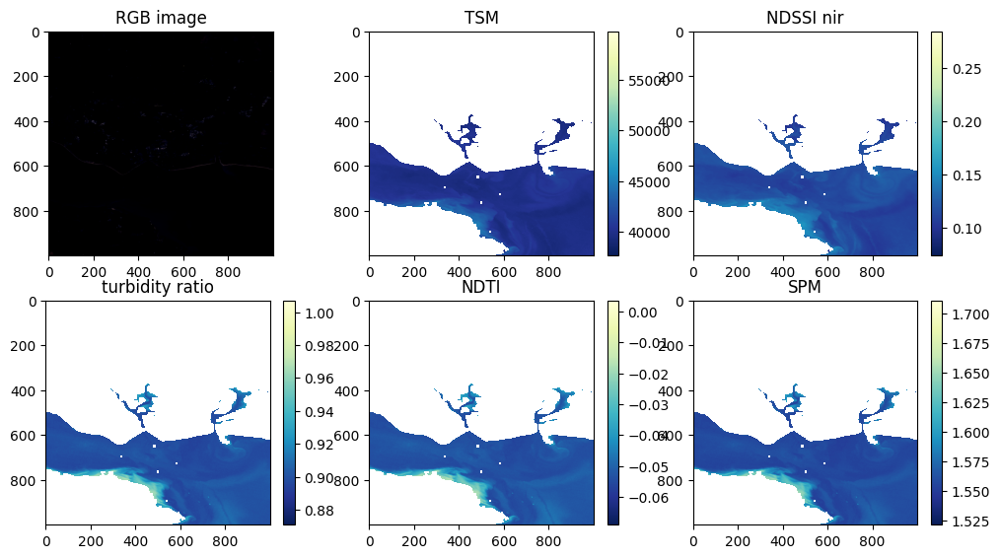

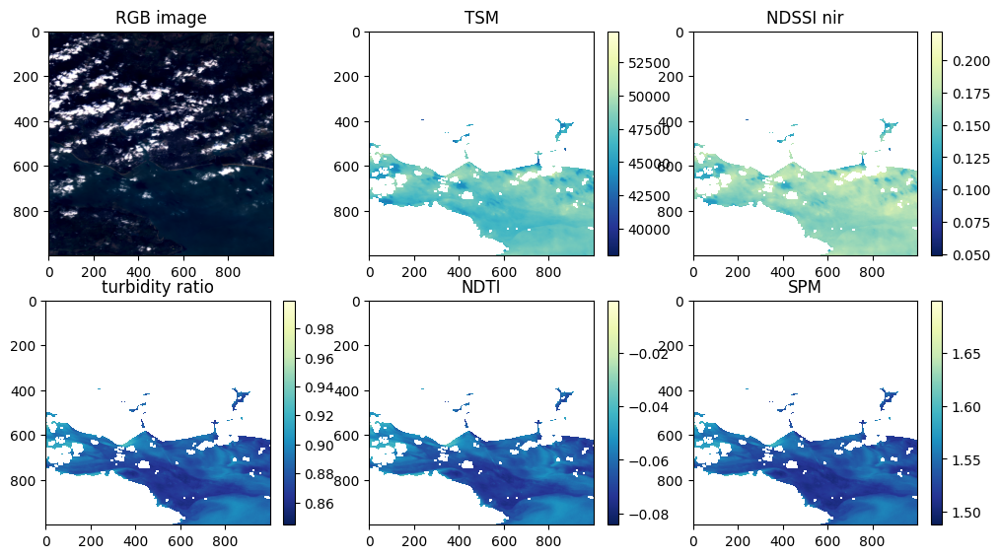

<ipython-input-65-8f74eb6c4395>:59: RuntimeWarning: invalid value encountered in divide
  NDSSI_img = (self.G_dg - self.NIR_dg) / (self.G_dg + self.NIR_dg)
<ipython-input-65-8f74eb6c4395>:47: RuntimeWarning: invalid value encountered in divide
  tr_img = self.R_dg / self.G_dg
<ipython-input-65-8f74eb6c4395>:34: RuntimeWarning: invalid value encountered in divide
  NDTI_img = (self.R_dg - self.G_dg) / (self.R_dg + self.G_dg)
<ipython-input-65-8f74eb6c4395>:77: RuntimeWarning: invalid value encountered in divide
  SPM_ind = 2.26*(self.R_dg/self.G_dg)**3 - 5.42 * (self.R_dg/self.G_dg)**2 + 5.58 * (self.R_dg/self.G_dg) - 0.72


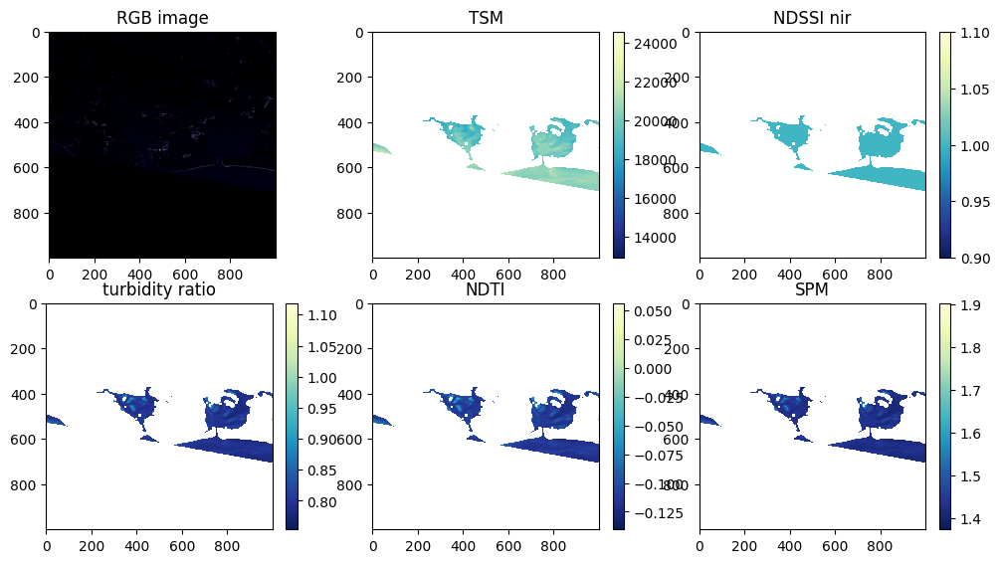

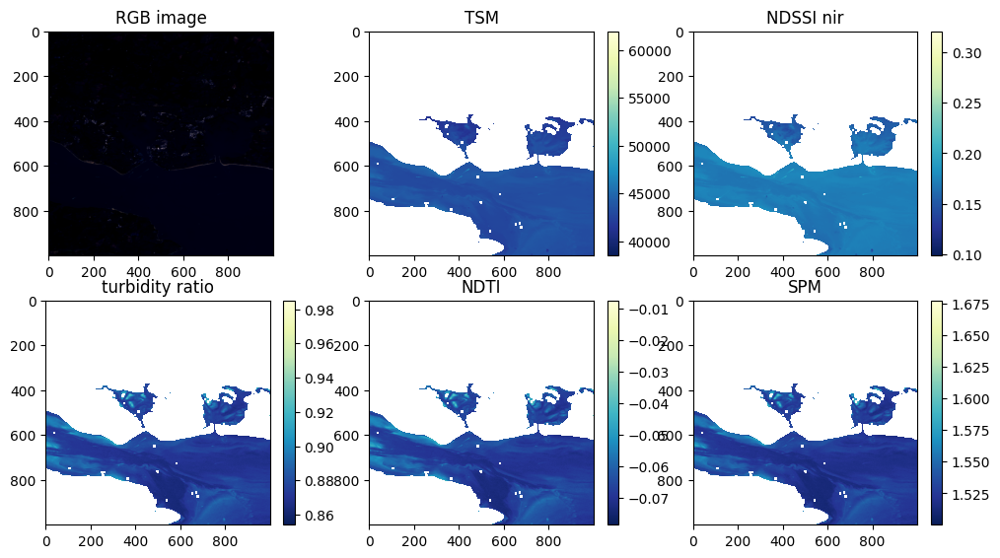

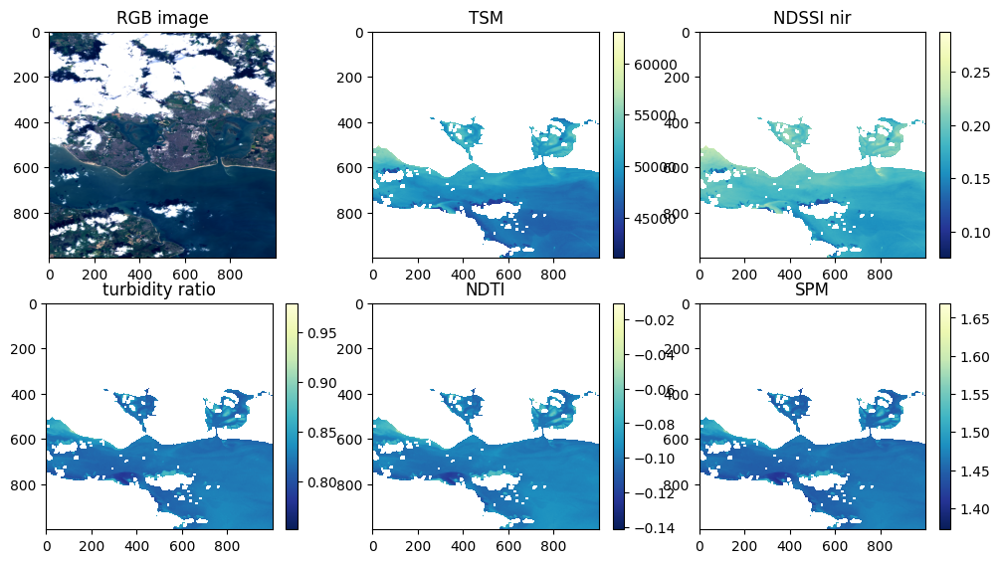

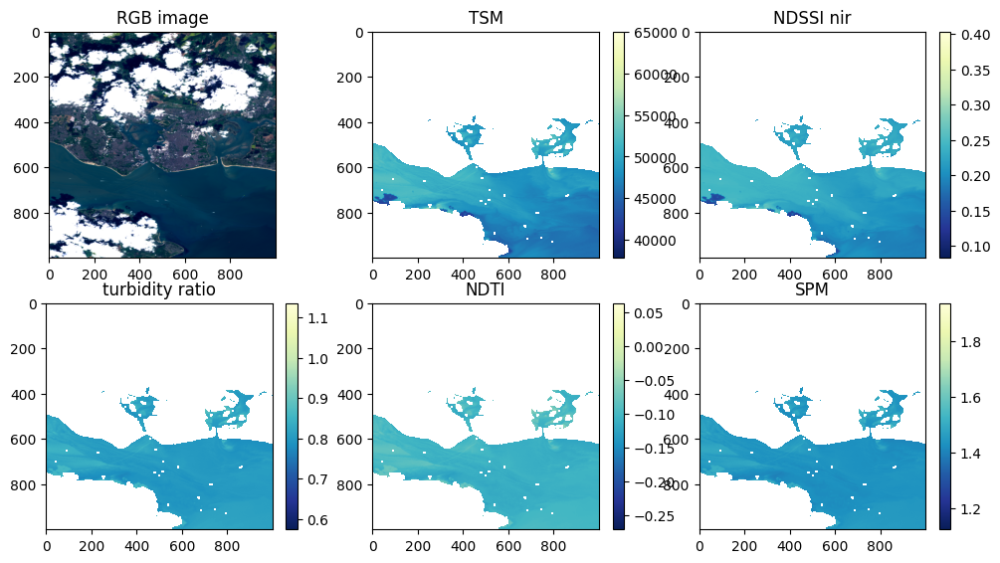

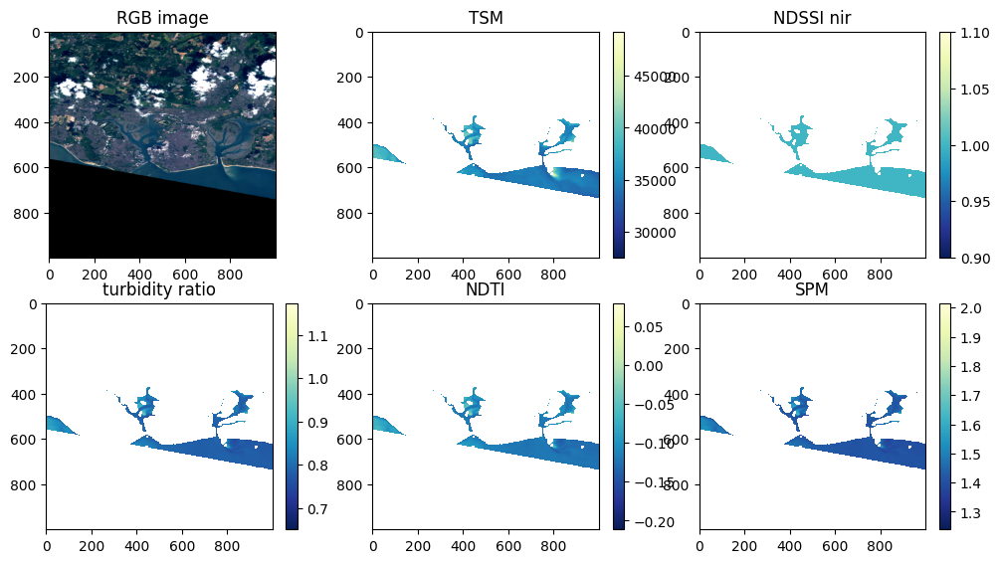

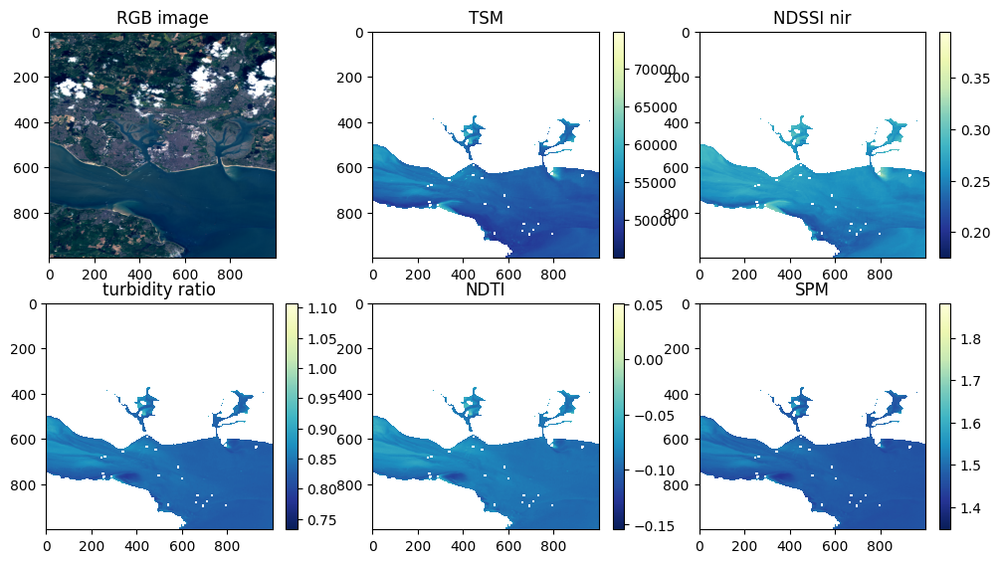

In [67]:
plot_sediment('/content/drive/MyDrive/TinyML/Satellite/Portsmouth')

We now define the inertidal area

In [68]:
def intertidal_area(path_main_directory):
    if not os.path.isdir(path_main_directory):
        return "Main directory does not exist."

    contents = os.listdir(path_main_directory)

    subdirectory_SR = path_main_directory + "/SR"
    list_date = os.listdir(subdirectory_SR)

    prediction_count = 0  # To count number of predictions plotted
    good_images= 0

    water_inter = np.zeros(shape=(1000000))
    for dirpath, dirnames, filenames in os.walk(subdirectory_SR):
        if "2017" in os.path.basename(dirpath):
          if filenames:
              for filename in filenames[::-1]:

                  file_path = os.path.join(dirpath, filename)
                  file_path_RAW = file_path.replace("SR", "RAW")
                  # Plotting and image processing starts here
                  if os.path.isfile(file_path_RAW) == True:

                    RAW_reader = rasterio.open(file_path_RAW)
                    image_shape = RAW_reader.read(1).shape
                    raw_image = np.dstack([
                        RAW_reader.read(1),
                        RAW_reader.read(2),
                        RAW_reader.read(3),
                        RAW_reader.read(4),
                        RAW_reader.read(5),
                        RAW_reader.read(6),
                    ])


                    # Resize the images
                    test_image_water = scaler_BCLW.transform(raw_image.reshape((image_shape[0], image_shape[1], 6)))

                    predictions = BCLWMasks(test_image_water.reshape((np.prod(image_shape), 6)))
                    predicted_classes = np.argmax(predictions, axis=1)

                    prediction_count += 1
                  if len(predicted_classes[predicted_classes==2])< len(predictions)*.05:
                      if len(predicted_classes[predicted_classes==3])< len(predictions)*.05:

                        water_inter += predictions[:,1]
                        good_images += 1




                  # We need a few prediction to define the intertidal area, as an area that is in same cases water and in other land
                  if prediction_count== 15:
                    water_mean = water_inter / good_images
                    intertidal_zone_mask = np.logical_and(water_mean > np.std(water_mean), water_mean < 2*np.std(water_mean))
                    im = plt.imshow(intertidal_zone_mask.reshape((image_shape[0], image_shape[1])))
                    plt.colorbar(im)
                    plt.show()

                    return intertidal_zone_mask.reshape((image_shape[0], image_shape[1]))

                  if prediction_count >= 15:
                    break


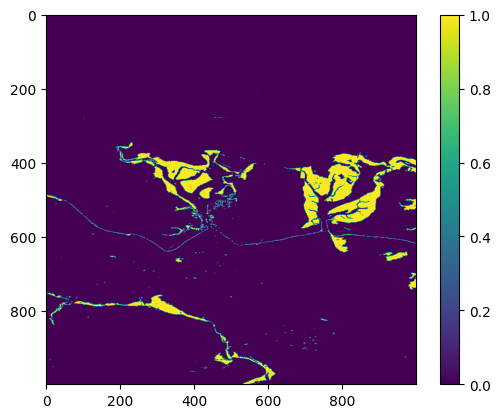

In [69]:
intertidal_mask = intertidal_area('/content/drive/MyDrive/TinyML/Satellite/Portsmouth')

In [70]:
import pandas as pd

In [71]:
columns = ['date', 'NDSSI_tot', 'NDSSI_mean', "NDSSI_sigma", 'TSM_tot', 'TSM_mean', "TSM_sigma"]
results_df = pd.DataFrame(columns=columns)

In [72]:
def sediment_analysis_no_intertidal(path_main_directory, intertidal_mask, results_df, columns):
    if not os.path.isdir(path_main_directory):
        return "Main directory does not exist."

    contents = os.listdir(path_main_directory)

    subdirectory_SR = path_main_directory + "/SR"
    list_date = os.listdir(subdirectory_SR)

    results = []

    water_inter = np.zeros(shape=(1000000))
    for dirpath, dirnames, filenames in os.walk(subdirectory_SR):
        if filenames:
            for filename in filenames:

                file_path = os.path.join(dirpath, filename)
                date = filename[-12:-4]

                file_path_RAW = file_path.replace("SR", "RAW")
                # Plotting and image processing starts here
                if os.path.isfile(file_path_RAW) == True:

                  RAW_reader = rasterio.open(file_path_RAW)
                  image_shape = RAW_reader.read(1).shape
                  raw_image = np.dstack([
                      RAW_reader.read(1),
                      RAW_reader.read(2),
                      RAW_reader.read(3),
                      RAW_reader.read(4),
                      RAW_reader.read(5),
                      RAW_reader.read(6),
                  ])

                  test_image_water = scaler_BCLW.transform(raw_image.reshape((image_shape[0], image_shape[1], 6)))

                  predictions = BCLWMasks(test_image_water.reshape((np.product(image_shape), 6)))
                  predicted_classes = np.argmax(predictions, axis=1)
                  water_mask = predictions[:,1]
                  water_mask = np.where(water_mask > 0.85, 1, 0).reshape((image_shape[0], image_shape[1]))
                  water_mask = np.where(intertidal_mask==True, 0, water_mask)


                  TSM_img = Sediment_dg(RAW_reader, water_mask).TSM()
                  NDSSI_img = Sediment_dg(RAW_reader, water_mask).NDSSI_nir()

                  NDSSI_tot = np.nansum(NDSSI_img)
                  NDSSI_mean = np.nanmean(NDSSI_img)
                  NDSSI_sigma = np.nanstd(NDSSI_img)
                  TSM_tot = np.nansum(TSM_img)
                  TSM_mean = np.nanmean(TSM_img)
                  TSM_sigma = np.nanstd(TSM_img)

                  # Create a dictionary for the current row
                  row_data = {
                      'date': date,
                      'NDSSI_tot': NDSSI_tot,
                      'NDSSI_mean': NDSSI_mean,
                      'NDSSI_sigma': NDSSI_sigma,
                      'TSM_tot': TSM_tot,
                      'TSM_mean': TSM_mean,
                      'TSM_sigma': TSM_sigma,
                 }
                  results.append(row_data)

                  results_df = pd.DataFrame(results)

    return results_df

In [73]:
results_df = sediment_analysis_no_intertidal('/content/drive/MyDrive/TinyML/Satellite/WaterNets/Portsmouth', intertidal_mask, results_df, columns)

<ipython-input-73-70e3985d7217>:1: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  results_df = sediment_analysis_no_intertidal('/content/drive/MyDrive/TinyML/Satellite/WaterNets/Portsmouth', intertidal_mask, results_df, columns)
<ipython-input-65-8f74eb6c4395>:59: RuntimeWarning: invalid value encountered in divide
  NDSSI_img = (self.G_dg - self.NIR_dg) / (self.G_dg + self.NIR_dg)


In [74]:
results_df

,date,NDSSI_tot,NDSSI_mean,NDSSI_sigma,TSM_tot,TSM_mean,TSM_sigma
0,20220320,66748.910253,0.208656,0.008982,1.614052e+10,50454.894677,1116.657978
1,20180924,64336.412269,0.201213,0.015033,1.400659e+10,43805.768220,1306.996579
2,20180917,43959.850879,0.146265,0.019930,1.315481e+10,43769.107503,1687.155149
3,20180901,62603.518339,0.201768,0.031403,1.511569e+10,48717.220133,3648.020809
4,20180924,48828.000000,1.000000,0.000000,1.286212e+09,26341.684469,1290.897556
5,20220811,81209.798410,0.253727,0.013232,1.494706e+10,46699.644226,1380.036004
6,20231125,51612.698284,0.158134,0.007686,1.361412e+10,41711.856679,731.501431
7,20231125,74933.000000,1.000000,0.000000,1.219883e+09,16279.643565,1209.294629
8,20200625,81229.438128,0.255413,0.014400,1.654460e+10,52021.806934,1681.588333
9,20200602,59779.352309,0.197842,0.011300,1.576414e+10,52172.025706,1272.647418


In [75]:
results_df.loc[:,"date"] = pd.to_datetime(results_df["date"], format='%Y%m%d')


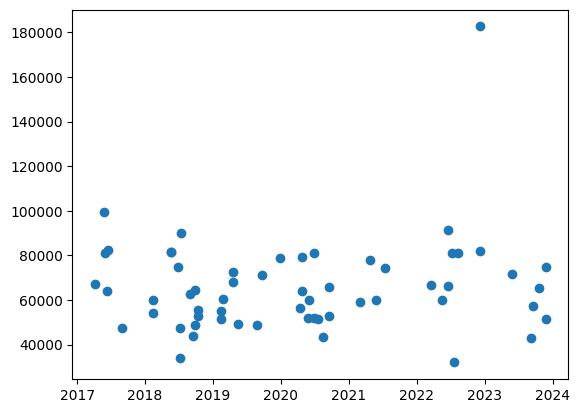

In [76]:
plt.scatter(results_df["date"], results_df["NDSSI_tot"])
plt.show()

In [77]:
columns = ['date', 'NDSSI_tot', 'NDSSI_mean', "NDSSI_sigma", 'TSM_tot', 'TSM_mean', "TSM_sigma"]
results_inter_df = pd.DataFrame(columns=columns)

In [78]:
def sediment_analysis_intertidal(path_main_directory, intertidal_mask, results_df, columns):
    if not os.path.isdir(path_main_directory):
        return "Main directory does not exist."

    contents = os.listdir(path_main_directory)

    subdirectory_SR = path_main_directory + "/SR"
    list_date = os.listdir(subdirectory_SR)

    results = []

    water_inter = np.zeros(shape=(1000000))
    for dirpath, dirnames, filenames in os.walk(subdirectory_SR):
        if filenames:
            for filename in filenames:

                file_path = os.path.join(dirpath, filename)
                date = filename[-12:-4]

                file_path_RAW = file_path.replace("SR", "RAW")
                # Plotting and image processing starts here
                if os.path.isfile(file_path_RAW) == True:

                  RAW_reader = rasterio.open(file_path_RAW)
                  image_shape = RAW_reader.read(1).shape
                  raw_image = np.dstack([
                      RAW_reader.read(1),
                      RAW_reader.read(2),
                      RAW_reader.read(3),
                      RAW_reader.read(4),
                      RAW_reader.read(5),
                      RAW_reader.read(6),
                  ])

                  test_image_water = scaler_BCLW.transform(raw_image.reshape((image_shape[0], image_shape[1], 6)))

                  predictions = BCLWMasks(test_image_water.reshape((np.product(image_shape), 6)))
                  predicted_classes = np.argmax(predictions, axis=1)
                  water_mask = predictions[:,1]
                  water_mask = np.where(water_mask > 0.85, True, False)
                  cloud_mask = predictions[:,2]
                  blank_mask = predictions[:,3]
                  water_mask[(intertidal_mask.flatten()==True)&(cloud_mask<0.25)&(blank_mask<0.25)] = 1
                  water_mask = water_mask.reshape((image_shape[0], image_shape[1]))


                  rgb_image  = scale_im(RAW_reader)
                  # Plotting
                  fig, ax = plt.subplots(1, 2, figsize=(6,6.5))
                  ax[0].imshow(rgb_image)
                  ax[0].title.set_text('RGB image')


                  ax[1].imshow(water_mask)
                  plt.show()

                  TSM_img = Sediment_dg(RAW_reader, water_mask).TSM()
                  NDSSI_img = Sediment_dg(RAW_reader, water_mask).NDSSI_nir()

                  NDSSI_tot = np.nansum(NDSSI_img)
                  NDSSI_mean = np.nanmean(NDSSI_img)
                  NDSSI_sigma = np.nanstd(NDSSI_img)
                  TSM_tot = np.nansum(TSM_img)
                  TSM_mean = np.nanmean(TSM_img)
                  TSM_sigma = np.nanstd(TSM_img)

                  # Create a dictionary for the current row
                  row_data = {
                      'date': date,
                      'NDSSI_tot': NDSSI_tot,
                      'NDSSI_mean': NDSSI_mean,
                      'NDSSI_sigma': NDSSI_sigma,
                      'TSM_tot': TSM_tot,
                      'TSM_mean': TSM_mean,
                      'TSM_sigma': TSM_sigma,
                 }
                  results.append(row_data)

                  results_inter_df = pd.DataFrame(results)

    return results_inter_df

<ipython-input-79-df0c95737d92>:1: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  results_inter_df = sediment_analysis_intertidal('/content/drive/MyDrive/TinyML/Satellite/WaterNets/Portsmouth', intertidal_mask, results_inter_df, columns)


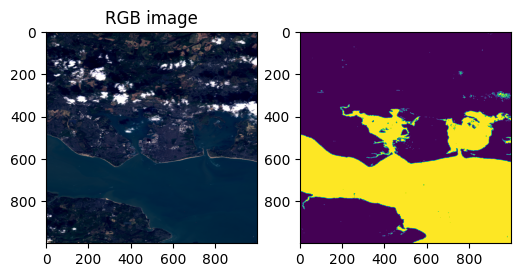

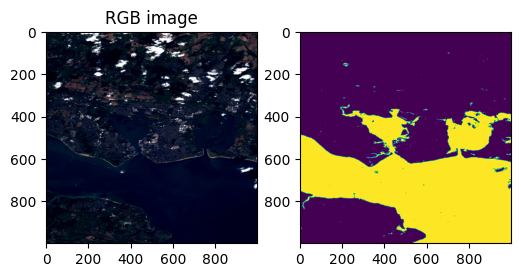

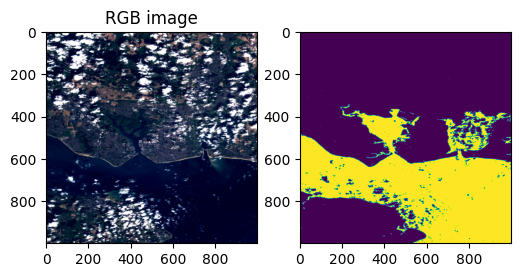

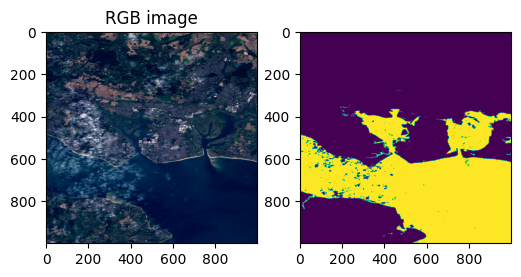

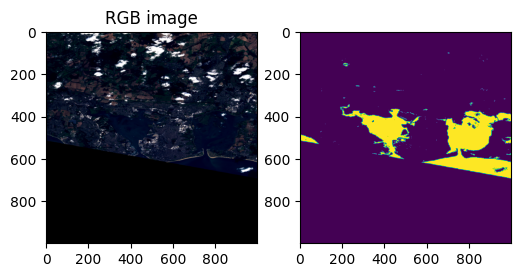

<ipython-input-65-8f74eb6c4395>:59: RuntimeWarning: invalid value encountered in divide
  NDSSI_img = (self.G_dg - self.NIR_dg) / (self.G_dg + self.NIR_dg)


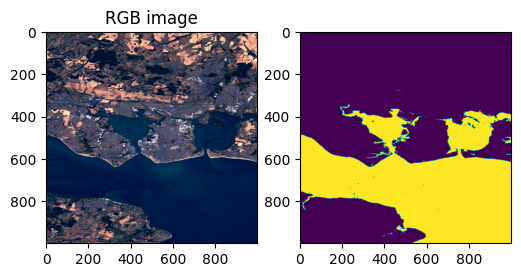

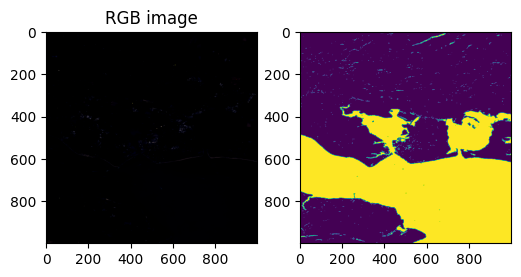

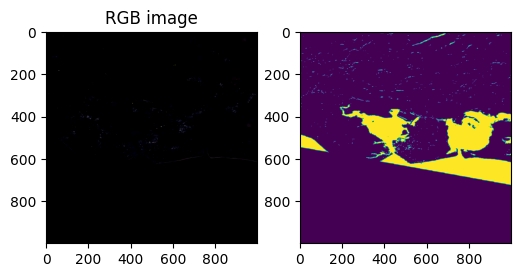

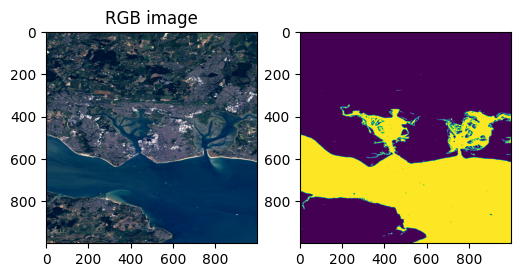

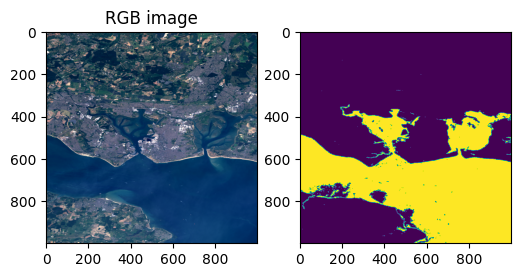

...

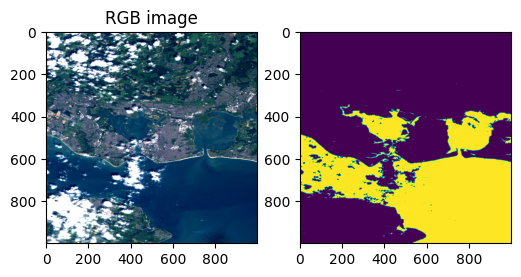

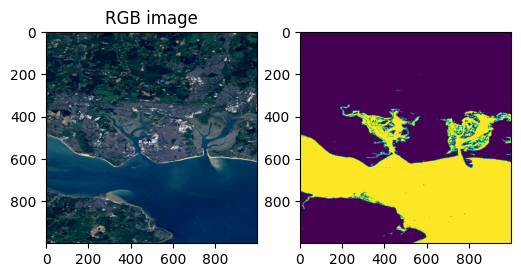

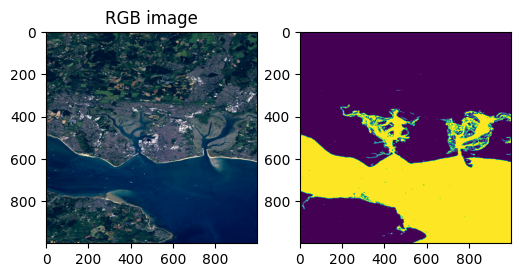

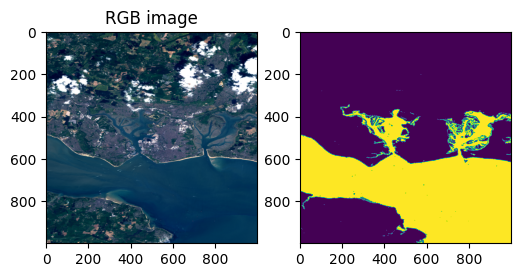

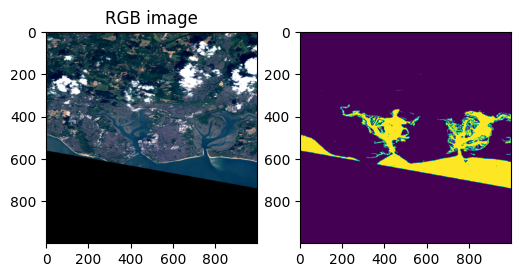

In [79]:
results_inter_df = sediment_analysis_intertidal('/content/drive/MyDrive/TinyML/Satellite/WaterNets/Portsmouth', intertidal_mask, results_inter_df, columns)

In [80]:
results_inter_df

,date,NDSSI_tot,NDSSI_mean,NDSSI_sigma,TSM_tot,TSM_mean,TSM_sigma
0,20220320,76241.830962,0.207976,0.011990,1.850652e+10,50483.007557,1473.574952
1,20180924,74397.067353,0.203136,0.017374,1.612143e+10,44018.384632,1744.212182
2,20180917,49942.904335,0.147557,0.024112,1.487486e+10,43947.857225,2273.360802
3,20180901,73508.996444,0.206427,0.033293,1.759881e+10,49420.845992,4130.622986
4,20180924,87485.000000,1.000000,0.000000,2.329440e+09,26626.740515,1297.443221
5,20220811,93972.554121,0.255389,0.014374,1.726043e+10,46908.699336,1549.232439
6,20231125,58636.047977,0.156977,0.008318,1.554109e+10,41605.667561,789.962811
7,20231125,114472.000000,1.000000,0.000000,1.852596e+09,16183.838193,1159.220706
8,20200625,93150.293294,0.260222,0.022100,1.891681e+10,52845.410440,3314.766820
9,20200602,69846.536591,0.201257,0.016196,1.828506e+10,52686.958432,2120.884453


In [81]:
results_inter_df.loc[:,"date"] = pd.to_datetime(results_inter_df["date"], format='%Y%m%d')


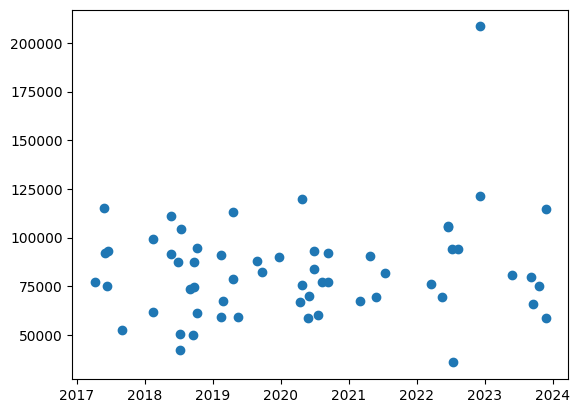

In [82]:
plt.scatter(results_inter_df["date"], results_inter_df["NDSSI_tot"])
plt.show()